## Q3) É possível identificar vendas superfaturadas em determinado segmento?  [uma venda com valores unitários discrepantes pode ser superfaturada] 

- escolher um conjunto de NCMs de grupos parecidos, clusterizar por VALOR DA NOTA FISCAL, VALOR UNITÁRIO, QUANTIDADE

### Importação de Bibliotecas

In [1]:
import pandas as pd
import seaborn as sns

from classes import Preprocessing, Clustering


### Leitura de Dados

In [2]:
raw_df = pd.read_csv('data/processed_nfe/nfe_ncm_34.csv')

print(raw_df.columns)

Index(['CHAVE DE ACESSO', 'MODELO', 'SÉRIE', 'NÚMERO', 'NATUREZA DA OPERAÇÃO',
       'DATA EMISSÃO', 'EVENTO MAIS RECENTE', 'DATA/HORA EVENTO MAIS RECENTE',
       'CPF/CNPJ Emitente', 'RAZÃO SOCIAL EMITENTE',
       'INSCRIÇÃO ESTADUAL EMITENTE', 'UF EMITENTE', 'MUNICÍPIO EMITENTE',
       'CNPJ DESTINATÁRIO', 'NOME DESTINATÁRIO', 'UF DESTINATÁRIO',
       'INDICADOR IE DESTINATÁRIO', 'DESTINO DA OPERAÇÃO', 'CONSUMIDOR FINAL',
       'PRESENÇA DO COMPRADOR', 'VALOR NOTA FISCAL', 'NÚMERO PRODUTO',
       'DESCRIÇÃO DO PRODUTO/SERVIÇO', 'CÓDIGO NCM/SH',
       'NCM/SH (TIPO DE PRODUTO)', 'CFOP', 'QUANTIDADE', 'UNIDADE',
       'VALOR UNITÁRIO', 'VALOR TOTAL', 'ANO MES'],
      dtype='object')


### Pré-processamento

Tipagem

In [3]:
df = Preprocessing.define_types(raw_df)
df = Preprocessing.filter_event_authorized(df)

In [4]:
# get the dummies and store it in a variable
dummies = pd.get_dummies(df['INDICADOR IE DESTINATÁRIO'])
 
# Concatenate the dummies to original dataframe
df = pd.concat([df, dummies], axis='columns')

In [5]:
df['INDICADOR IE DESTINATÁRIO'].value_counts()

NÃO CONTRIBUINTE       46623
CONTRIBUINTE ISENTO    14220
CONTRIBUINTE ICMS       1212
Name: INDICADOR IE DESTINATÁRIO, dtype: int64

In [6]:
print(len(df))

df[['CÓDIGO NCM/SH', 'NCM/SH (TIPO DE PRODUTO)', 'VALOR NOTA FISCAL','QUANTIDADE','VALOR UNITÁRIO','VALOR TOTAL','CONTRIBUINTE ICMS','CONTRIBUINTE ISENTO','NÃO CONTRIBUINTE']].head()

62055


,CÓDIGO NCM/SH,NCM/SH (TIPO DE PRODUTO),VALOR NOTA FISCAL,QUANTIDADE,VALOR UNITÁRIO,VALOR TOTAL,CONTRIBUINTE ICMS,CONTRIBUINTE ISENTO,NÃO CONTRIBUINTE
0,34011190,"Outros produtos/preparações de toucador, em ba...",1903.20,120.0,7.90,948.00,0,1,0
1,34025000,NaN,1903.20,480.0,1.99,955.20,0,1,0
2,34029039,Outras preparações para lavagem (detergentes),661.17,41.0,1.17,47.97,0,1,0
3,34029039,Outras preparações para lavagem (detergentes),622.91,2.0,1.17,2.34,0,1,0
4,34025000,NaN,622.91,1.0,3.72,3.72,0,1,0


In [7]:
attributes = ['QUANTIDADE','VALOR UNITÁRIO','VALOR TOTAL','CONTRIBUINTE ICMS','CONTRIBUINTE ISENTO','NÃO CONTRIBUINTE']
X = df[attributes]
X_norm = Preprocessing.apply_normalization(X)

X.head()

,QUANTIDADE,VALOR UNITÁRIO,VALOR TOTAL,CONTRIBUINTE ICMS,CONTRIBUINTE ISENTO,NÃO CONTRIBUINTE
0,120.0,7.90,948.00,0,1,0
1,480.0,1.99,955.20,0,1,0
2,41.0,1.17,47.97,0,1,0
3,2.0,1.17,2.34,0,1,0
4,1.0,3.72,3.72,0,1,0


### Clustering

##### Mean Shift

In [ ]:
# Apply Mean Shift
print('Mean Shift --------------')
X_ms, clusters_predicted_ms, clusters_ms, centers_ms, size_ms = Clustering.apply_meanshift(X, X_norm)

Tamanho de cada cluster:
1: 46623 (75.13%)
2: 14219 (22.91%)
3:  1210 ( 1.95%)
4:     2 ( 0.00%)
5:     1 ( 0.00%)


In [ ]:
Clustering.print_calinski_harabasz_score(X_norm, clusters_predicted_ms)
metric_SC_samples_ms = Clustering.print_silhouette_score(X, X_norm, clusters_predicted_ms)

Calinski-Harabasz Index: 23250548.206
Silhouette Coefficient: 0.99664


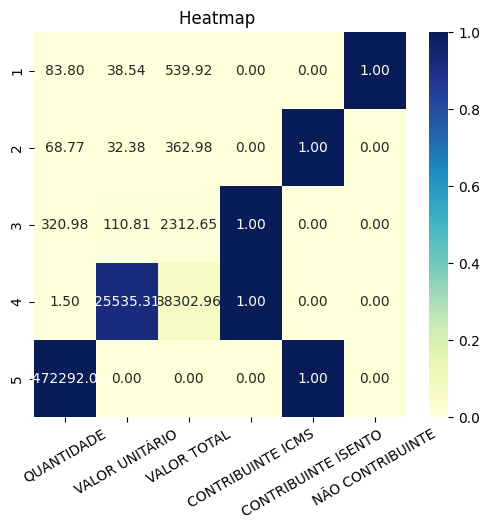

<Figure size 640x480 with 0 Axes>

In [ ]:
num_clusters = len(set(clusters_predicted_ms))

# Define color to use in following visualizations
colors = sns.color_palette(palette='Paired', n_colors=num_clusters, desat=None)

Clustering.plot_centroids_heatmap(X, centers_ms, 'Heatmap ')

fig = Clustering.plot_parallel_coordinates(X, metric_SC_samples_ms, num_clusters, clusters_ms, attributes, colors)

##### Mean Shift

In [17]:
attributes = ['VALOR NOTA FISCAL', 'QUANTIDADE','VALOR UNITÁRIO']
X = df[attributes]
X_norm = Preprocessing.apply_normalization(X)

X.head()

,VALOR NOTA FISCAL,QUANTIDADE,VALOR UNITÁRIO
0,1903.20,120.0,7.90
1,1903.20,480.0,1.99
2,661.17,41.0,1.17
3,622.91,2.0,1.17
4,622.91,1.0,3.72


In [18]:
# Apply Mean Shift
print('Mean Shift --------------')
X_ms, clusters_predicted_ms, clusters_ms, centers_ms, size_ms = Clustering.apply_meanshift(X, X_norm)

Mean Shift --------------
Tempo de execução: 1409.52 segundos

Tamanho de cada cluster:
1: 57389 (92.48%)
2:  1598 ( 2.58%)
3:   959 ( 1.55%)
7:   395 ( 0.64%)
4:   385 ( 0.62%)
5:   175 ( 0.28%)
14:   164 ( 0.26%)
6:   100 ( 0.16%)
21:    56 ( 0.09%)
92:    47 ( 0.08%)
8:    45 ( 0.07%)
9:    37 ( 0.06%)
13:    34 ( 0.05%)
34:    33 ( 0.05%)
10:    27 ( 0.04%)
15:    26 ( 0.04%)
12:    25 ( 0.04%)
11:    22 ( 0.04%)
16:    21 ( 0.03%)
17:    17 ( 0.03%)
20:    14 ( 0.02%)
18:    14 ( 0.02%)
24:    13 ( 0.02%)
19:    13 ( 0.02%)
38:    12 ( 0.02%)
23:    10 ( 0.02%)
25:    10 ( 0.02%)
27:     9 ( 0.01%)
31:     9 ( 0.01%)
32:     9 ( 0.01%)
33:     8 ( 0.01%)
39:     8 ( 0.01%)
28:     8 ( 0.01%)
26:     8 ( 0.01%)
35:     7 ( 0.01%)
45:     7 ( 0.01%)
55:     7 ( 0.01%)
30:     7 ( 0.01%)
46:     6 ( 0.01%)
37:     6 ( 0.01%)
36:     6 ( 0.01%)
48:     6 ( 0.01%)
41:     6 ( 0.01%)
40:     5 ( 0.01%)
169:     5 ( 0.01%)
29:     5 ( 0.01%)
53:     5 ( 0.01%)
44:     5 ( 0.01%)
43:     

In [16]:
Clustering.print_calinski_harabasz_score(X_norm, clusters_predicted_ms)
metric_SC_samples_ms = Clustering.print_silhouette_score(X, X_norm, clusters_predicted_ms)

Calinski-Harabasz Index: 240594.064
Silhouette Coefficient: 0.82939


KeyboardInterrupt: 

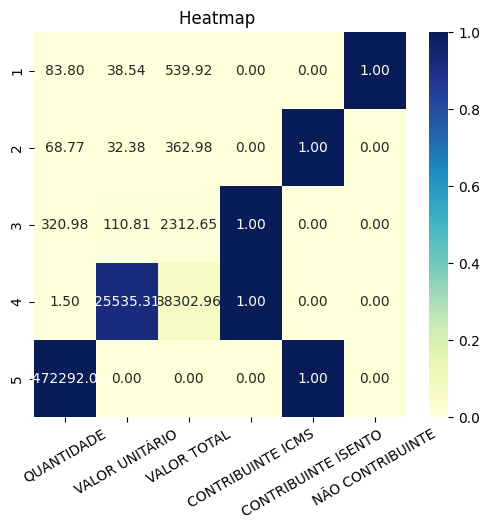

<Figure size 640x480 with 0 Axes>

In [ ]:
num_clusters = len(set(clusters_predicted_ms))

# Define color to use in following visualizations
colors = sns.color_palette(palette='Paired', n_colors=num_clusters, desat=None)

Clustering.plot_centroids_heatmap(X, centers_ms, 'Heatmap ')

fig = Clustering.plot_parallel_coordinates(X, metric_SC_samples_ms, num_clusters, clusters_ms, attributes, colors)

#####   Gaussian Mixture

In [16]:
# Apply gaussian mixture
for cluster in range(2,6):
    print(f'k={cluster}')
    X, clusters_predicted, clusters, size = Clustering.apply_gaussianmixture(X, X_norm, cluster)
    Clustering.print_calinski_harabasz_score(X_norm, clusters_predicted)
    metric_SC_samples = Clustering.print_silhouette_score(X, X_norm, clusters_predicted)

k=2
Tempo de execução: 0.32 segundos
Tamanho de cada cluster:
0: 46623 (75.13%)
1: 15432 (24.87%)
Calinski-Harabasz Index: 592657.510
Silhouette Coefficient: 0.96072
k=3
Tempo de execução: 0.57 segundos
Tamanho de cada cluster:
0: 46623 (75.13%)
1: 14220 (22.92%)
2:  1212 ( 1.95%)
Calinski-Harabasz Index: 39746044.223
Silhouette Coefficient: 0.99693
k=4
Tempo de execução: 3.20 segundos
Tamanho de cada cluster:
0: 44079 (71.03%)
1: 14220 (22.92%)
3:  2544 ( 4.10%)
2:  1212 ( 1.95%)
Calinski-Harabasz Index: 28501631.155
Silhouette Coefficient: 0.91486
k=5
Tempo de execução: 6.50 segundos
Tamanho de cada cluster:
0: 43283 (69.75%)
1: 14220 (22.92%)
4:  2863 ( 4.61%)
2:  1212 ( 1.95%)
3:   477 ( 0.77%)
Calinski-Harabasz Index: 24229082.325
Silhouette Coefficient: 0.88020


In [9]:
num_clusters = 3
attributes = ['QUANTIDADE','VALOR UNITÁRIO','VALOR TOTAL','CONTRIBUINTE ICMS','CONTRIBUINTE ISENTO','NÃO CONTRIBUINTE']
X = df[attributes]
X, clusters_predicted, clusters, size = Clustering.apply_gaussianmixture(X, X_norm, num_clusters)
metric_SC_samples = Clustering.print_silhouette_score(X, X_norm, clusters_predicted)

# Define color to use in following visualizations
colors = sns.color_palette(palette='tab10', n_colors=num_clusters, desat=None)

# Plot parallel coordinate
fig = Clustering.plot_parallel_coordinates(X, metric_SC_samples, num_clusters, clusters, attributes, colors)
fig.write_html("fig/q3/gm_parallel.html")


Tempo de execução: 1.90 segundos
Tamanho de cada cluster:
0: 46623 (75.13%)
1: 14220 (22.92%)
2:  1212 ( 1.95%)
Silhouette Coefficient: 0.99693


<Figure size 640x480 with 0 Axes>

In [19]:
df_plot = X.groupby(['QUANTIDADE','VALOR UNITÁRIO','VALOR TOTAL'])['cluster'].mean().reset_index(name='Quantidade de NFEs')

KeyError: 'Column not found: cluster'

In [10]:
ax = sns.heatmap(glue, annot=True)
ax.set(xlabel="", ylabel="")
ax.xaxis.tick_top()

,QUANTIDADE,VALOR UNITÁRIO,VALOR TOTAL,CONTRIBUINTE ICMS,CONTRIBUINTE ISENTO,NÃO CONTRIBUINTE,cluster
0,120.0,7.90,948.00,0,1,0,1
1,480.0,1.99,955.20,0,1,0,1
2,41.0,1.17,47.97,0,1,0,1
3,2.0,1.17,2.34,0,1,0,1
4,1.0,3.72,3.72,0,1,0,1
...,...,...,...,...,...,...,...
65975,1.0,39.50,39.50,0,0,1,0
65976,1.0,16.04,16.04,0,0,1,0
65977,2.0,3.50,7.00,0,0,1,0
65978,3.0,16.04,48.12,0,0,1,0


from sklearn.cluster import DBSCAN

clustering = DBSCAN(eps=3, min_samples=2).fit(X)
